In [1]:
cd ..

/Users/lisawink/Documents/freiburg


In [93]:
# 2D vs 3D Paramters

In [94]:
import geopandas as gpd
import pandas as pd
from scipy.stats import pearsonr, spearmanr
from sklearn.feature_selection import mutual_info_regression
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import matplotlib.pyplot as plt
import calc_params
import numpy as np
import altair as alt
from mpl_toolkits.mplot3d import Axes3D
alt.data_transformers.enable("vegafusion")
import warnings
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
warnings.filterwarnings('ignore')

In [95]:
temp =  pd.read_csv('/Users/lisawink/Documents/paper1/data/gap_filled_data_ta_rh.csv')
temp['datetime_UTC']=pd.to_datetime(temp['datetime_UTC'])
temp = temp[temp['variable']=='Ta_deg_C']
temp['datetime_UTC'] = temp['datetime_UTC'].astype(str)
temp = temp.pivot(index='station_id', columns='datetime_UTC', values='value')

In [5]:
hiwn = pd.read_csv('/Users/lisawink/Documents/paper1/data/processed_data/heat_island_winter_nights.csv')

In [98]:
hiwn

,datetime_UTC
0,2022-11-08 00:00:00+00:00
1,2022-11-08 01:00:00+00:00
2,2022-11-08 02:00:00+00:00
3,2022-11-08 03:00:00+00:00
4,2022-11-08 04:00:00+00:00
...,...
80,2023-03-21 01:00:00+00:00
81,2023-03-21 02:00:00+00:00
82,2023-03-21 03:00:00+00:00
83,2023-03-21 05:00:00+00:00


In [7]:
radius = 200

In [8]:
vars = gpd.read_parquet(f'/Users/lisawink/Documents/paper1/data/processed_data/processed_station_params_{radius}.parquet')
vars.index = vars['station_id']

In [9]:
to_remove = ['station_id','station_no','station_name','station_long_name','station_type','station_lat','station_lon','station_elevation','mounting_structure','sky_view_factor','dominant_land_use','local_climate_zone','urban_atlas_class','urban_atlas_code','geometry','SVF']
vars = vars.drop(to_remove, axis=1)

In [10]:
vars = gpd.read_parquet(f'/Users/lisawink/Documents/paper1/data/processed_data/processed_station_params_{radius}.parquet')
vars.index = vars['station_id']
to_remove = ['station_id','station_no','station_name','station_long_name','station_type','station_lat','station_lon','station_elevation','mounting_structure','sky_view_factor','dominant_land_use','local_climate_zone','urban_atlas_class','urban_atlas_code','geometry','SVF']
vars = vars.drop(to_remove, axis=1)
params = vars.columns
vars = vars.merge(temp, left_on='station_id', right_on='station_id',how='inner')

scaler = StandardScaler()
vars_scaled = scaler.fit_transform(vars)
vars = pd.DataFrame(vars_scaled, columns=vars.columns, index=vars.index)


In [11]:
def stats_multiple_times(radius, var, time):

    #vars['BuSqC_wmean'] = -vars['BuSqC_wmean']
    #vars['BuFra_3D_wmean'] = -vars['BuFra_3D_wmean']
    #vars['BuIBD'] = -vars['BuIBD']
    #vars['BuAdj'] = -vars['BuAdj']

    data = vars[[var] + list(hiwn.values.flatten())].copy().reset_index()
    data = data.melt(id_vars=[var,'station_id'], value_vars=hiwn.values.flatten(), var_name='time', value_name='temperature')
    data = data.dropna()


    # Compute Spearman correlation
    spearman_corr, p_value = spearmanr(data[var], data['temperature'])

    if len(data) < 3:
        pearson_corr = np.nan
        r_squared = np.nan
        rmse = np.nan
        cooks_d = np.nan
        y_pred = np.nan
    else:
        #Pearson and r squared
        pearson_corr, _ = pearsonr(data[var], data['temperature'])
        X = sm.add_constant(data[var])  # Add constant for regression
        model = sm.OLS(data['temperature'], X).fit()
        r_squared = model.rsquared

        # Get the predicted values (fitted values)
        y_pred = model.fittedvalues

        # Calculate the residuals (errors)
        residuals = data['temperature'] - y_pred

        # Calculate the least squares error (RSS)
        rss = np.sum(residuals ** 2)
        # Calculate the Mean Squared Error (MSE)
        mse = rss / len(data[var])
        # Calculate the Root Mean Squared Error (RMSE)
        rmse = np.sqrt(mse)

        # Compute Cook's distance
        influence = model.get_influence()
        cooks_d = influence.cooks_distance[0].max()  # Max Cook's distance

    return data, spearman_corr, p_value, pearson_corr, r_squared, rmse, cooks_d, y_pred

In [20]:
stats = {}

for param in list(params.values):
    data, spearman_corr, p_value, pearson_corr, r_squared, rmse, cooks_d, y_pred = stats_multiple_times(radius, param, hiwn)
    stats[param] = {'spearman_corr': spearman_corr, 'p_value': p_value, 'pearson_corr': pearson_corr, 'r_squared': r_squared, 'rmse': rmse, 'cooks_d': cooks_d, 'y_pred': y_pred}

In [21]:
stats = pd.DataFrame(stats).T

In [36]:
stats['Parameter'] = stats.index

In [23]:
stats.to_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/hiwn/hiwn_stats_{radius}.csv')

In [16]:
#stats = pd.read_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/hiwn/hiwn_stats_{radius}.csv')

In [31]:
# select stats where mutual information is higher than 
selected_stats = stats[(abs(stats['spearman_corr']) > 0.1)]

In [32]:
selected_stats['Parameter'] = selected_stats.index

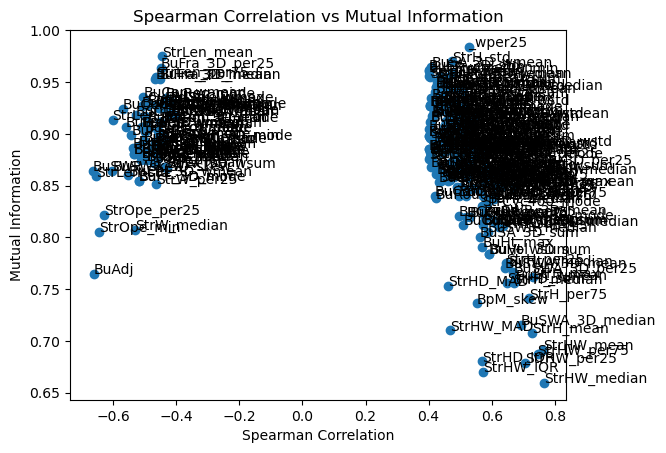

In [26]:
# plot spearman correlation and mutual information on plot for selected stats
# colour by groups

plt.scatter(selected_stats['spearman_corr'], selected_stats['rmse'])
plt.xlabel('Spearman Correlation')
plt.ylabel('Mutual Information')
plt.title('Spearman Correlation vs Mutual Information') 

for i, txt in enumerate(selected_stats['Parameter']):
    plt.annotate(txt, (selected_stats['spearman_corr'].iloc[i], selected_stats['rmse'].iloc[i]))
    
plt.show()

In [28]:
selected_stats

,spearman_corr,p_value,pearson_corr,r_squared,rmse,cooks_d,y_pred,Parameter
BuAdj,-0.660165,0.0,-0.644761,0.415717,0.764384,0.007508,0 -0.818381 1 0.445840 2 -0.33...,BuAdj
BuAre_sum,0.436421,0.0,0.500783,0.250784,0.865573,0.004721,0 -0.040972 1 -0.103366 2 0.55...,BuAre_sum
BuHt_mean,0.62015,0.0,0.581362,0.337981,0.813645,0.010766,0 -0.007832 1 -0.088492 2 -0.45...,BuHt_mean
BuHt_median,0.585643,0.0,0.552875,0.305671,0.833264,0.006729,0 -0.108897 1 -0.513832 2 -0.60...,BuHt_median
BuHt_std,0.4823,0.0,0.465806,0.216975,0.884887,0.007038,0 -0.090821 1 0.429560 2 0.58...,BuHt_std
...,...,...,...,...,...,...,...,...
StrENR400_sum,0.422033,0.0,0.492193,0.242253,0.895275,0.003317,0 0.012276 1 -0.354026 3 -0.21...,StrENR400_sum
StrENR400_mode,0.567473,0.0,0.522151,0.272641,0.87714,0.00531,0 -0.787216 1 -1.016885 3 0.24...,StrENR400_mode
StrENR400_per25,0.546927,0.0,0.522787,0.273306,0.876739,0.006104,0 -0.837953 1 -1.073580 3 0.14...,StrENR400_per25
StrDeg_sum,0.439103,0.0,0.502711,0.252719,0.889071,0.003371,0 -0.124385 1 -0.456502 3 -0.21...,StrDeg_sum


In [33]:
# make interactive plot of plt.scatter(selected_stats['spearman_corr'], selected_stats['rmse'])

alt.Chart(selected_stats).mark_circle().encode(
    x='spearman_corr',
    y='rmse',
    tooltip=['Parameter']
).interactive()

alt.Chart(...)

In [35]:
# make interactive plot of plt.scatter(selected_stats['spearman_corr'], selected_stats['rmse'])

alt.Chart(selected_stats).mark_circle().encode(
    x='spearman_corr',
    y='cooks_d',
    tooltip=['Parameter']
).interactive()

alt.Chart(...)

In [37]:
alt.Chart(stats).mark_circle().encode(
    x='spearman_corr',
    y='cooks_d',
    tooltip=['Parameter']
).interactive()

alt.Chart(...)

In [77]:
items = vars.columns.unique()

# Define mapping of abbreviations to categories
prefix_to_category = {
    'BuAre': 'Dimension', 'BuHt': 'Dimension', 'BuPer': 'Dimension',
    'BuLAL': 'Dimension', 'BuCCD': 'Dimension', 'BuCor': 'Dimension',
    'BuSA' : 'Dimension', 'BuVol': 'Dimension', 'BuSWA': 'Dimension',
    'CyAre': 'Dimension', 'CyInd': 'Dimension', 'BuCWA': 'Shape',
    'BuCon': 'Shape', 'BuElo': 'Shape', 'BuERI': 'Shape',
    'BuFR': 'Shape', 'BuFF': 'Shape', 'BuFD': 'Shape',
    'BuRec': 'Shape', 'BuShI': 'Shape', 'BuSqC': 'Shape',
    'BuSqu': 'Shape', 'BuCir': 'Shape', 'BuHem': 'Shape',
    'BuFra' : 'Shape', 'BuCubo' : 'Shape',  'BuProx' : 'Shape',
    'BuSpi' : 'Shape', 'BuPerC' : 'Shape', 'BuGir' : 'Shape',
    'BuRan' : 'Shape', 'BuAdj': 'Distribution', 'BuIBD': 'Distribution',
    'BuSWR': 'Distribution', 'BuOri': 'Orientation', 'BuAli': 'Orientation',
    'StrAli': 'Orientation', 'StrW': 'Distribution', 'StrWD': 'Distribution',
    'StrOpe': 'Distribution', 'StrHW': 'Distribution', 'StrH': 'Dimension',
    'StrHD': 'Distribution','StrLen': 'Dimension',
    'StrCNS': 'Dimension', 'BpM': 'Intensity', 'StrLin': 'Shape',
    'StrClo400': 'Connectivity', 'StrBet400': 'Connectivity', 
    'StrSCl': 'Connectivity', 'StrCyc400': 'Connectivity', 
    'StrENR400': 'Connectivity', 'StrGam400': 'Connectivity', 
    'StrDeg': 'Connectivity', 'StrMes400': 'Connectivity',
    'SVF': 'Distribution'
}

unique_prefixes = [item.split('_')[0] for item in items]

# Generate categories data dynamically
categories_data = [
    {'Category': prefix_to_category.get(prefix, 'Unknown'), 'Abbrev.': items[i]}
    for i,prefix in enumerate(unique_prefixes)
]

In [63]:
# if 3D is in Parameter name, add column 3D
stats['Category'] = stats['Parameter'].apply(lambda x: '3D' if ('3D' in x) else ('2.5D' if ('StrH' in x) or ('BuHt' in x) else '2D'))


In [59]:
stats['spearman_corr_abs'] = abs(stats['spearman_corr'])

In [44]:
time = hiwn.loc[0]

In [51]:
scaled_subselect = vars[stats['Parameter']]
scaled_subselect[time] = vars[time]

# Create the new structure
rows = []
for station_id, row in scaled_subselect.iterrows():
    y = float(row[time].values)
    for param in scaled_subselect.columns[:-1]:  # Exclude 'y'
        rows.append({
            "station_id": station_id,
            "x": row[param],
            "y": y,
            "Parameter": param
        })

# Create the transformed DataFrame
transformed_df = pd.DataFrame(rows).set_index("station_id")
#categories_df = pd.DataFrame(categories_data)

In [47]:
#selected_stats = selected_stats.merge(categories_df, how='left', left_on='Parameter', right_on='Abbrev.')

In [53]:
transformed_df

,x,y,Parameter
station_id,,,
FRASHA,1.269277,-0.810619,BuAdj
FRASHA,0.964411,-0.810619,BuIBD
FRASHA,0.385688,-0.810619,BuAre_mean
FRASHA,-0.533553,-0.810619,BuAre_median
FRASHA,2.171563,-0.810619,BuAre_std
...,...,...,...
FRZAHR,-0.562615,0.090679,BuCAR
FRZAHR,-0.382102,0.090679,SVF_mean
FRZAHR,0.426429,0.090679,SVF_std


In [55]:
params =  transformed_df
params['station_id'] = params.index
stats['stats'] = stats['Parameter'].str.split('_').str[1]

# Left plot: R-squared vs Gradient scatter plot
selection = alt.selection_point(fields=['Parameter'], empty='none', on='click', toggle='event.shiftKey')  # Selection on param
selection1 = alt.selection_point(fields=['Category'], bind='legend', on='click', toggle='event.shiftKey')
selection2 = alt.selection_point(fields=['stats'], bind='legend', on='click', toggle='event.shiftKey')

# Step 2: Add category coloring to scatter plot
category_colors = alt.Scale(scheme='category10')  # Use a predefined Altair color scheme

scatter_plot = alt.Chart(stats).mark_point(size=100).encode(
    x=alt.X('spearman_corr:Q', title='Spearman Correlation'),
    y=alt.Y('rmse:Q', title='RMSE'),
    color=alt.condition(selection1, 'Category:N', alt.value('lightgray')),
    shape=alt.Shape('stats:N', title='Statistic'),
    opacity=alt.condition(selection2, alt.value(1), alt.value(0.2)),
    tooltip=['Parameter', 'Category', 'spearman_corr', 'rmse']
).add_params(
    selection, selection1, selection2
).properties(
    title='Mutual Information vs Spearman Correlation',
    width=400,
    height=300
).interactive()

# Step 3: Right plot remains the same
points = alt.Chart(params).transform_filter(
    selection
).mark_point().encode(
    x=alt.X('x:Q', title='X'),
    y=alt.Y('y:Q', title='Temperature'),
    tooltip=['x', 'y']
)

# Create the text labels for the station IDs
text_labels = alt.Chart(params).transform_filter(
    selection
).mark_text(
    align='left', 
    baseline='middle', 
    dx=5,  # Slightly offset the text so it doesn't overlap the point
).encode(
    x='x',
    y='y',
    text='station_id'  # Use station_id as the label
)

# add drop down box for Parameter


regression_plot = (points + text_labels).properties(
    title='Linear Regression Plot',
    width=400,
    height=300
).interactive()

# Combine the plots
final_chart = alt.vconcat(scatter_plot, regression_plot)
final_chart.show()

alt.VConcatChart(...)

In [85]:
params =  transformed_df
params['station_id'] = params.index
stats['stats'] = stats['Parameter'].str.split('_').str[1]

# Left plot: R-squared vs Gradient scatter plot
selection = alt.selection_point(fields=['Parameter'], empty='none', on='click', toggle='event.shiftKey')  # Selection on param
selection1 = alt.selection_point(fields=['Category'], bind='legend', on='click', toggle='event.shiftKey')
selection2 = alt.selection_point(fields=['stats'], bind='legend', on='click', toggle='event.shiftKey')

# Step 2: Add category coloring to scatter plot
category_colors = alt.Scale(scheme='category10')  # Use a predefined Altair color scheme

scatter_plot = alt.Chart(stats).mark_point(size=100).encode(
    x=alt.X('spearman_corr_abs:Q', title='Absolute Spearman Correlation'),
    y=alt.Y('cooks_d:Q', title="Cook's Distance"),
    color=alt.condition(selection1, 'Category:N', alt.value('lightgray')),
    shape=alt.Shape('stats:N', title='Statistic'),
    opacity=alt.condition(selection2, alt.value(1), alt.value(0.2)),
    tooltip=['Parameter', 'Category', 'spearman_corr', 'rmse']
).add_params(
    selection, selection1, selection2
).properties(
    title="Cook's Distance vs Spearman Correlation",
    width=400,
    height=300
).interactive()

# Step 3: Right plot remains the same
points = alt.Chart(params).transform_filter(
    selection
).mark_point().encode(
    x=alt.X('x:Q', title='X'),
    y=alt.Y('y:Q', title='Temperature'),
    tooltip=['x', 'y']
)

# Create the text labels for the station IDs
text_labels = alt.Chart(params).transform_filter(
    selection
).mark_text(
    align='left', 
    baseline='middle', 
    dx=5,  # Slightly offset the text so it doesn't overlap the point
).encode(
    x='x',
    y='y',
    text='station_id'  # Use station_id as the label
)

# add drop down box for Parameter


regression_plot = (points + text_labels).properties(
    title='Linear Regression Plot',
    width=400,
    height=300
).interactive()

# Combine the plots
final_chart = alt.vconcat(scatter_plot, regression_plot)
final_chart.show()

alt.VConcatChart(...)

In [69]:
categories

BuAdj           1
BuIBD           1
BuAre_mean      1
BuAre_median    1
BuAre_std       1
               ..
BuCAR           1
SVF_mean        1
SVF_std         1
SVF_median      1
SVF_IQR         1
Length: 1359, dtype: int8

In [83]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

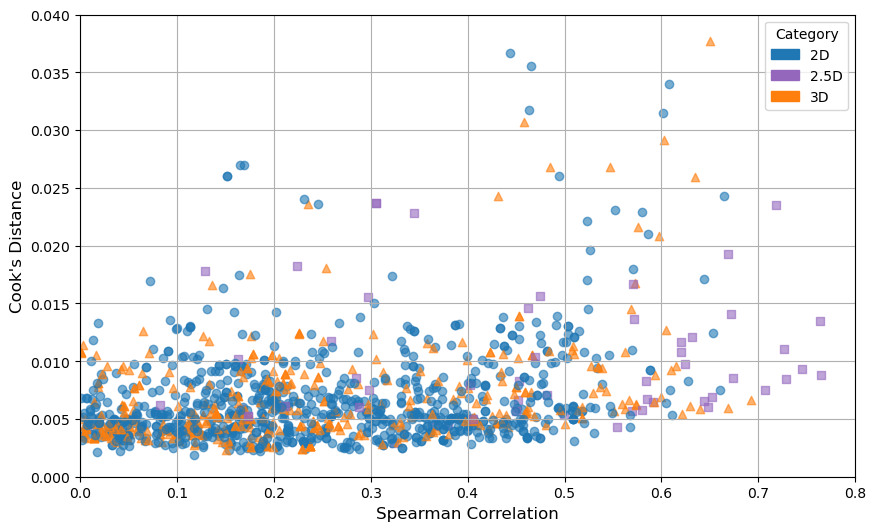

In [92]:
plt.figure(figsize=(10, 6))
plt.grid(True)
color_mapping = {'2D':'tab:blue','2.5D':'tab:purple','3D':'tab:orange'}
marker_mapping = {'2D':'o','2.5D':'s','3D':'^'}
colors = stats['Category'].apply(lambda x: color_mapping[x]).tolist()
markers = stats['Category'].apply(lambda x: marker_mapping[x]).tolist()
for color, marker, x, y in zip(colors, markers, stats['spearman_corr_abs'], stats['cooks_d']):
    plt.scatter(x, y, c=color, marker=marker, alpha=0.6)
plt.xlabel('Spearman Correlation', fontsize=12)
plt.ylabel("Cook's Distance", fontsize=12)
#plt.title("Cook's Distance vs Spearman Correlation")
plt.xlim(0, 0.8)
plt.ylim(0, 0.04)
# Create custom legend handles
handles = [mpatches.Patch(color=color, label=label) for label, color in color_mapping.items()]
plt.legend(handles=handles, title='Category')
plt.savefig('/Users/lisawink/Documents/paper1/figures/2d_vs_3d_hiwn_spearman_corr_cooks_d.png')
plt.show()


In [90]:
colors

BuAdj           tab:blue
BuIBD           tab:blue
BuAre_mean      tab:blue
BuAre_median    tab:blue
BuAre_std       tab:blue
                  ...   
BuCAR           tab:blue
SVF_mean        tab:blue
SVF_std         tab:blue
SVF_median      tab:blue
SVF_IQR         tab:blue
Name: Category, Length: 1359, dtype: object